# Insurance Claims- Fraud Detection

## Problem Statement:

### Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [176]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,BaggingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,plot_roc_curve
from sklearn.preprocessing import LabelEncoder,PowerTransformer,StandardScaler,OrdinalEncoder
from scipy.stats import zscore
import warnings
warnings.filterwarnings("ignore")

In [177]:
data=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")
data.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [178]:
data.shape

(1000, 40)

In [179]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
months_as_customer             1000 non-null int64
age                            1000 non-null int64
policy_number                  1000 non-null int64
policy_bind_date               1000 non-null object
policy_state                   1000 non-null object
policy_csl                     1000 non-null object
policy_deductable              1000 non-null int64
policy_annual_premium          1000 non-null float64
umbrella_limit                 1000 non-null int64
insured_zip                    1000 non-null int64
insured_sex                    1000 non-null object
insured_education_level        1000 non-null object
insured_occupation             1000 non-null object
insured_hobbies                1000 non-null object
insured_relationship           1000 non-null object
capital-gains                  1000 non-null int64
capital-loss                   1000 non-null int64
incident_date    

2 float type columns, 17 integer type columns and 21 object type columns.

In [180]:
data.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

_c39 this column has no valueall are null.

In [181]:
data.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

incident_location,policy_number has unique values its beter to remove such columns.

In [182]:
data.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [183]:
nueric_f=[]
categorical_f=[]
for col in data:
    if str(data[col].dtype)== 'object':
        categorical_f.append(col)
    else:
        nueric_f.append(col)
        
categorical_f.remove("fraud_reported")

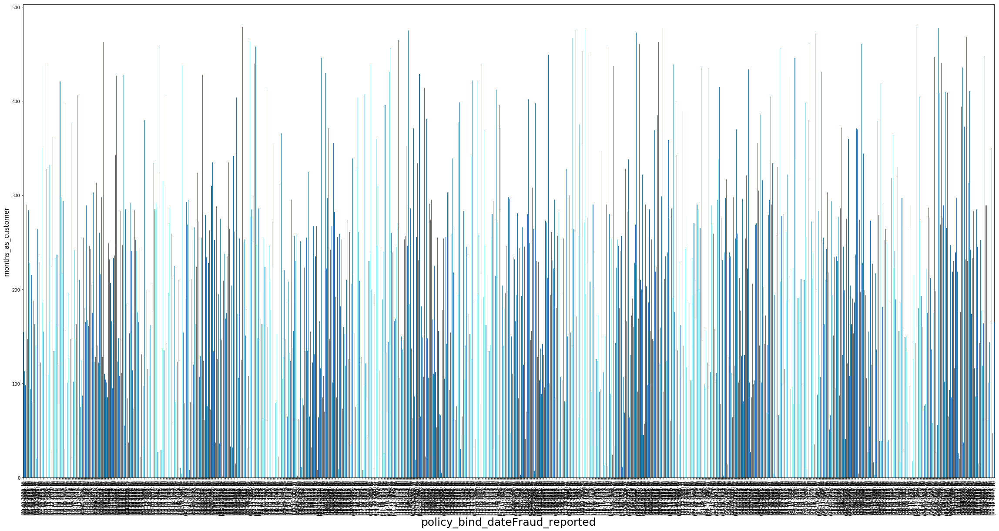

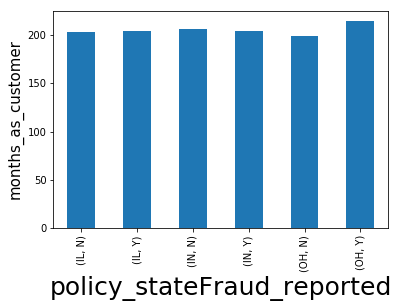

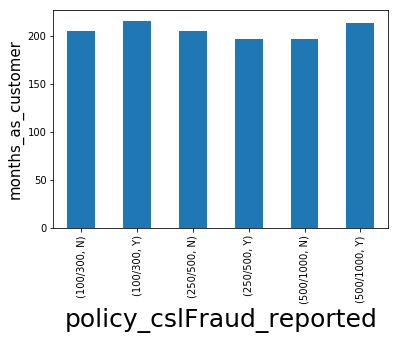

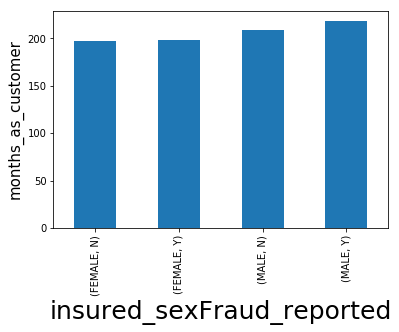

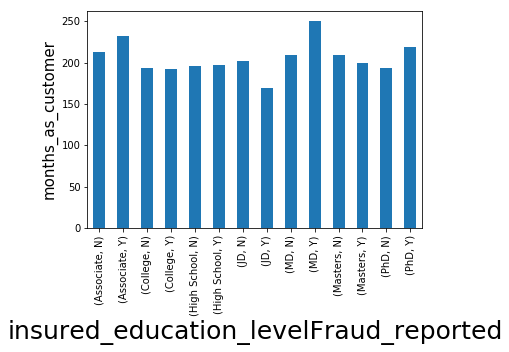

...

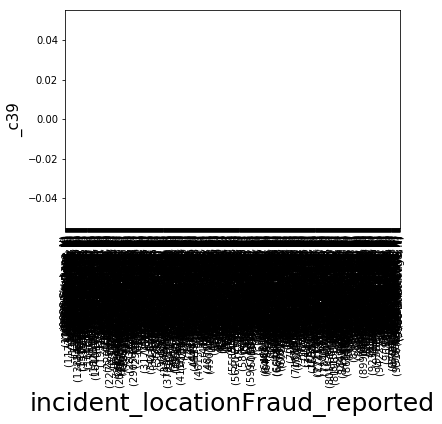

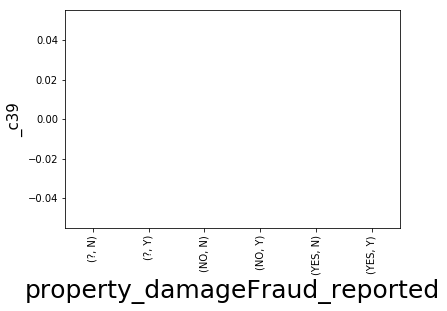

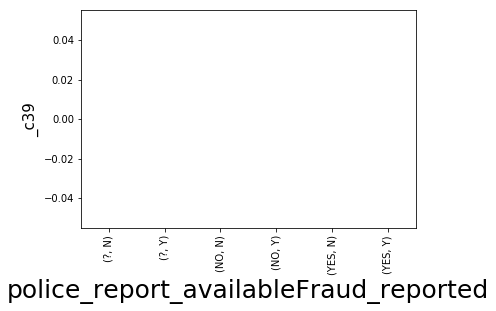

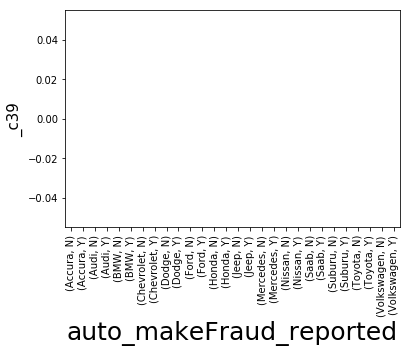

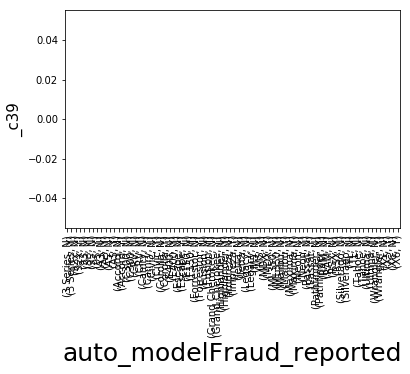

In [9]:
plt.figure(figsize=(40,20))
for col in nueric_f:
    for col1 in categorical_f:
        data.groupby([col1,"fraud_reported"])[col].mean().plot(kind='bar')
        plt.xlabel(col1+"Fraud_reported",fontsize=25)
        plt.ylabel(col,fontsize=15)
        plt.show()

OH class policy_state,policy_csl for 100/300 and 500/100, who are male & unmaaried,MD class insured educationLevel, having occupation of craft-repair,machine-op-inspct,prof-speciality,transport-moving, with vehicle theft type incident, front collision type,MinorDamage incidentSeverity,Police type authoriies,OH & VA type incidentState,hillsDale,Riverwood type incidentCities,No ploiceReport type,jeep autoMkae, reported fraud yes has average highest months as customer.

chess class insured hobbies,Fire type authoriies repoted fraud yes has highest average month as customer.


Trivial Damage incident severity thathas fraud reported yes having minimum avegrae age distribution.

average age,capital_gains,capital_loss is distributed to all categorical features with grouping with label

Trivial Damage incident severity thathas fraud reported yes having most ploicy deductable.

average ploicy deductable is distributed to all categorical features with grouping with label

100/300 ploicy_csl with no reported fraud has average umbrella_limit of 800000.

Male with parked car incidents type reported Fraud has max average umbrell_l imit while dodge auto make reported Fraud yes has the lowest average umbrella_limit.

average insured_zip is distributed to all categorical features with grouping with label

Average capital_loss for is maximum for hillsdale incidentCity and reported fraud yes.

Multi-vehicle collision type incident are reported most having or not reported fraud having most average numberof vehicle involved.

Total_claim_amount for parkin,vehicleTheft with or without fraud has the lowest claiims.

injury claim is lowest for parked-car and vehicletheft incident type,trivial damage incident severity with or without reported fraud.

property claim is lowest for parked-car and vehicletheft incident type,trivial damage incident severity with or without reported fraud.

While all other numeric type features showing their average values with categorical features grouped with Label i.e. Fraud_reported are seems to be normally distributed.

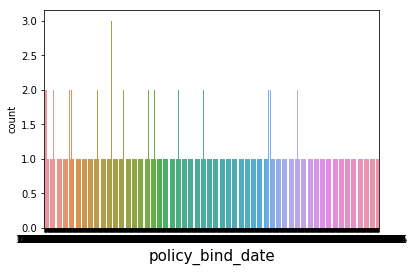

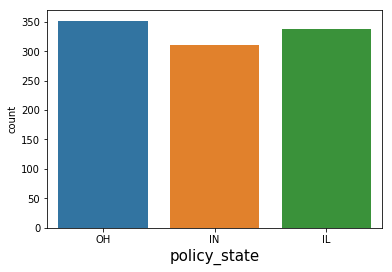

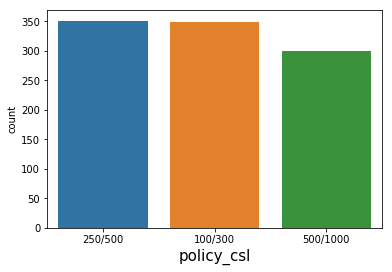

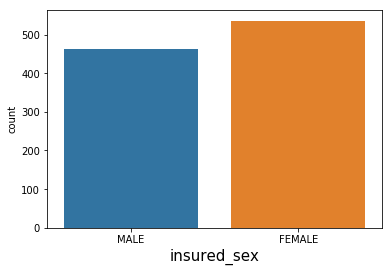

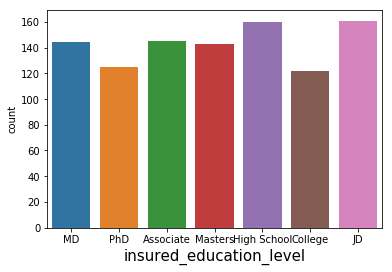

...

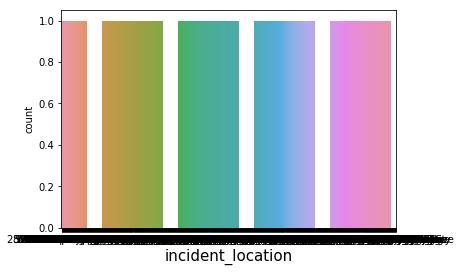

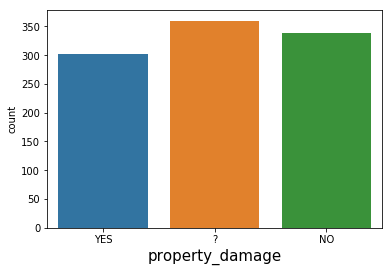

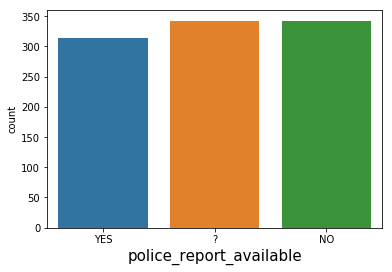

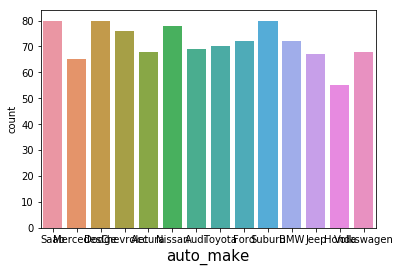

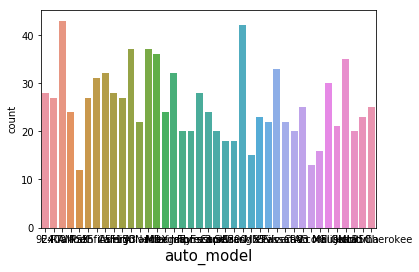

In [10]:
for col in categorical_f:
    sns.countplot(data[col])
    plt.xlabel(col,fontsize=15)
    plt.show()



In [184]:
data['collision_type']=data['collision_type'].replace("?","Rear Collision")  # replacing with the mode value of that column

In [185]:
## transforming Columns

lencoder=LabelEncoder()
oencoder=OrdinalEncoder()  #policy_csl,insured_education_level
# datas ---> policy_bind_date,incident_date
# Droop incident location
#propertyDamage,policeReport

data.policy_state=lencoder.fit_transform(data['policy_state'])
data.insured_sex=lencoder.fit_transform(data['insured_sex'])
data.insured_occupation=lencoder.fit_transform(data['insured_occupation'])
data.insured_hobbies=lencoder.fit_transform(data['insured_hobbies'])
data.insured_relationship=lencoder.fit_transform(data['insured_relationship'])
data.incident_type=lencoder.fit_transform(data['incident_type'])
data.collision_type=lencoder.fit_transform(data['collision_type'])
data.incident_severity=lencoder.fit_transform(data['incident_severity'])
data.authorities_contacted=lencoder.fit_transform(data['authorities_contacted'])
data.incident_state=lencoder.fit_transform(data['incident_state'])
data.incident_city=lencoder.fit_transform(data['incident_city'])
data.auto_make=lencoder.fit_transform(data['auto_make'])
data.auto_model=lencoder.fit_transform(data['auto_model'])

Oe=OrdinalEncoder(categories=[['100/300','250/500','500/1000'],['High School', 'College','Associate','MD', 'Masters','PhD','JD']])
data[['policy_csl','insured_education_level']]=Oe.fit_transform(data[['policy_csl','insured_education_level']])

In [186]:
data.property_damage.value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [187]:
data.police_report_available.value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [188]:
data['property_damage']=data['property_damage'].replace({"?":0,"NO":0,"YES":1})  # replacing with the mode value of that column
data['police_report_available']=data['police_report_available'].replace({"?":0,"NO":0,"YES":1})  # replacing with the mode value of that column

In [189]:
data.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                     int32
policy_csl                     float64
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                      int32
insured_education_level        float64
insured_occupation               int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_location               object
incident_hour_of_the_day 

In [190]:
## transforming policy_bind_date,incident_date_day column into day,month,year
data['policy_bind_date_day']=pd.to_datetime(data.policy_bind_date).dt.day
data['policy_bind_date_month']=pd.to_datetime(data.policy_bind_date).dt.month
data['policy_bind_date_year']=pd.to_datetime(data.policy_bind_date).dt.year
data['policy_bind_date_weekday']=pd.to_datetime(data.policy_bind_date).dt.weekday


data['incident_date_day']=pd.to_datetime(data.incident_date).dt.day
data['incident_date_month']=pd.to_datetime(data.incident_date).dt.month
data['incident_date_year']=pd.to_datetime(data.incident_date).dt.year
data['incident_date_weekday']=pd.to_datetime(data.incident_date).dt.weekday

In [191]:
data.drop(columns=['_c39','incident_date','policy_bind_date','incident_location','policy_number'],inplace=True)

In [192]:
nueric_f.extend(['policy_bind_date_day','policy_bind_date_month','policy_bind_date_year','incident_date_day','incident_date_month','incident_date_year'])
categorical_f.extend(['policy_bind_date_weekday',"incident_date_weekday"])

In [193]:
nueric_f.remove('policy_number')
nueric_f.remove('_c39')
categorical_f.remove('incident_date')
categorical_f.remove('policy_bind_date')
categorical_f.remove('incident_location')

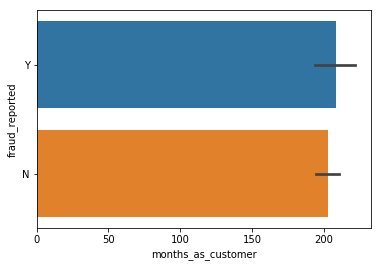

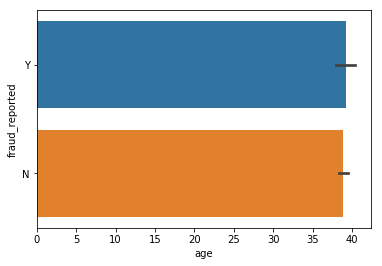

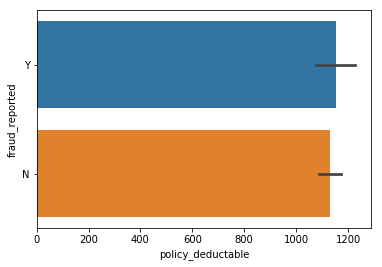

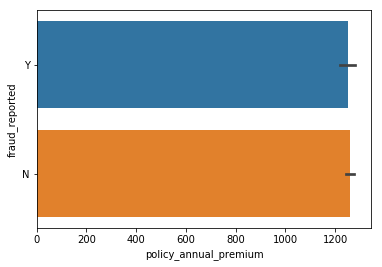

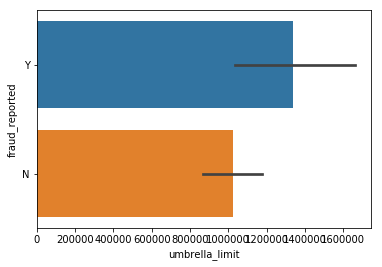

...

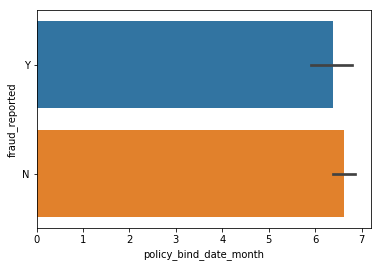

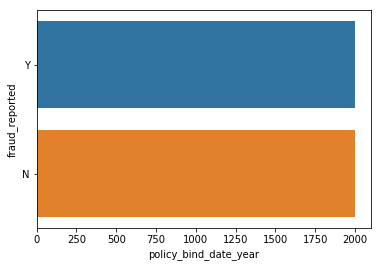

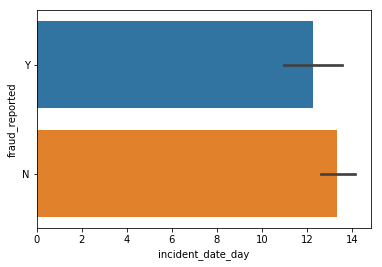

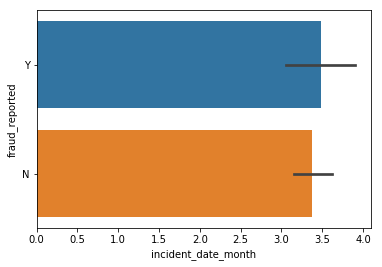

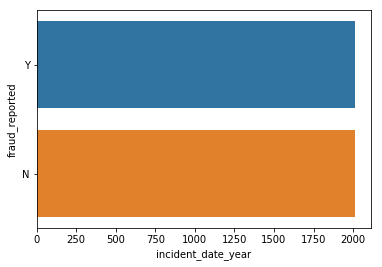

In [132]:
for col in nueric_f:
    sns.barplot(data[col],data.fraud_reported)
    plt.show()

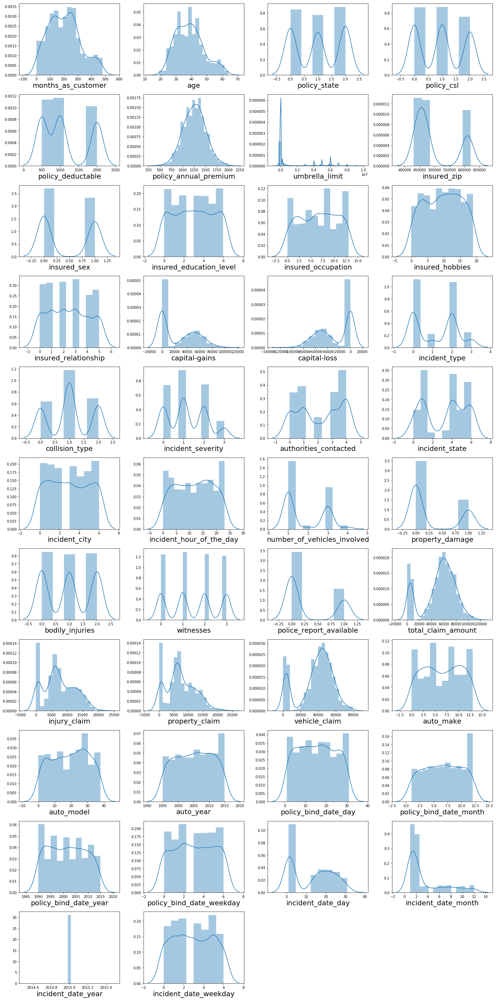

In [194]:
plt.figure(figsize=(20,40))
graph=1
for col in data.drop(columns=['fraud_reported'],axis=1):
    if graph<=44:
        ax=plt.subplot(11,4,graph)
        sns.distplot(data[col])
        plt.xlabel(col,fontsize=20)
    graph+=1
plt.tight_layout()

umbrella_limit,insured_zip,property_damage,police_report_available,total_claim_amount,vehicle_claim,incident_date_month these are not normally distributed.

In [195]:
data.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.004532
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.863806
bodily_injuries                0.014777


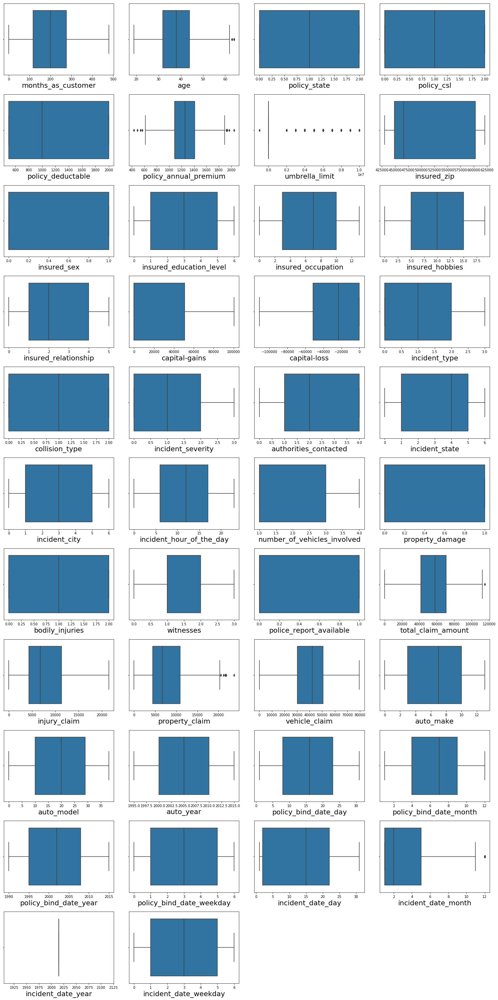

In [196]:
plt.figure(figsize=(20,40))
graph=1
for col in data.drop(columns=['fraud_reported'],axis=1):
    if graph<=44:
        ax=plt.subplot(11,4,graph)
        sns.boxplot(data[col])
        plt.xlabel(col,fontsize=20)
    graph+=1
plt.tight_layout()

In [197]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000.0,2.039540e+02,1.151132e+02,0.00,115.7500,199.5,276.250,479.00
age,1000.0,3.894800e+01,9.140287e+00,19.00,32.0000,38.0,44.000,64.00
policy_state,1000.0,1.014000e+00,8.309600e-01,0.00,0.0000,1.0,2.000,2.00
policy_csl,1000.0,9.510000e-01,8.045162e-01,0.00,0.0000,1.0,2.000,2.00
policy_deductable,1000.0,1.136000e+03,6.118647e+02,500.00,500.0000,1000.0,2000.000,2000.00
policy_annual_premium,1000.0,1.256406e+03,2.441674e+02,433.33,1089.6075,1257.2,1415.695,2047.59
umbrella_limit,1000.0,1.101000e+06,2.297407e+06,-1000000.00,0.0000,0.0,0.000,10000000.00
insured_zip,1000.0,5.012145e+05,7.170161e+04,430104.00,448404.5000,466445.5,603251.000,620962.00
insured_sex,1000.0,4.630000e-01,4.988786e-01,0.00,0.0000,0.0,1.000,1.00
insured_education_level,1000.0,3.007000e+00,2.041842e+00,0.00,1.0000,3.0,5.000,6.00


In [198]:
data.drop(columns=["incident_date_year"],inplace=True)

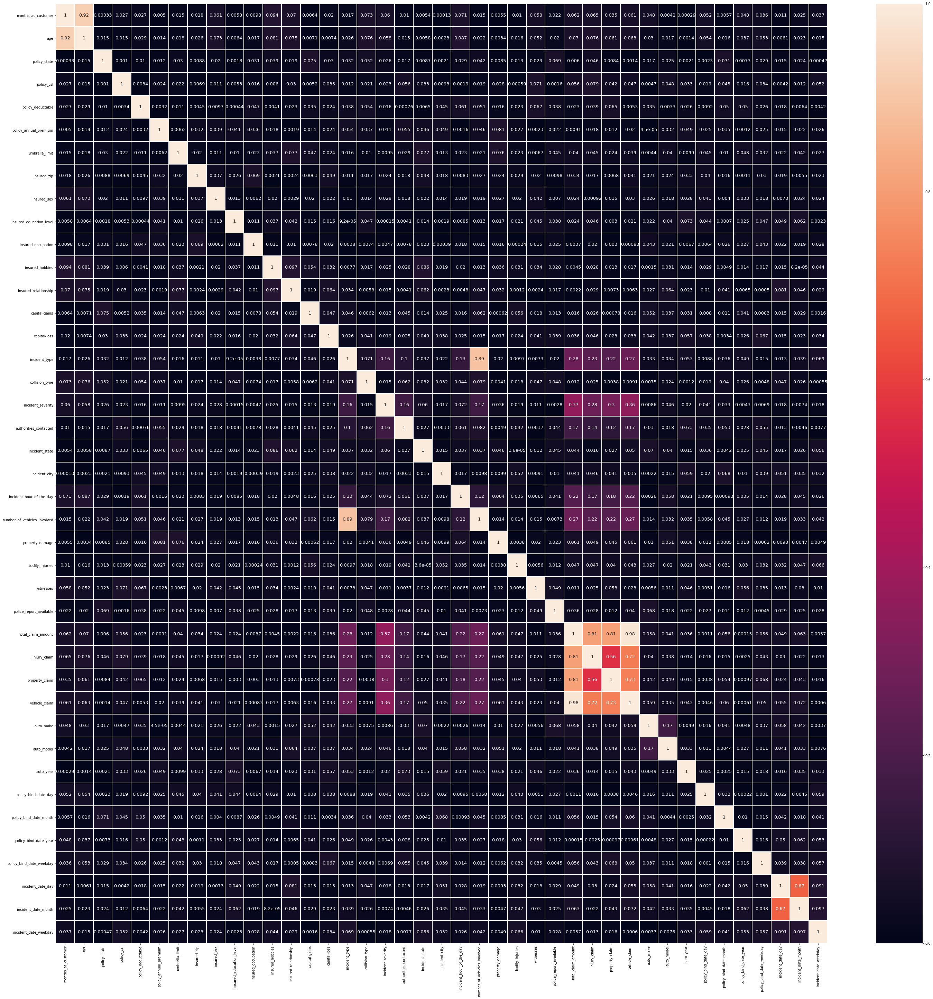

In [199]:
plt.figure(figsize=(50,50))
sns.heatmap(data.corr().abs(),annot=True,annot_kws={"size":13},linewidths=True)
plt.show()

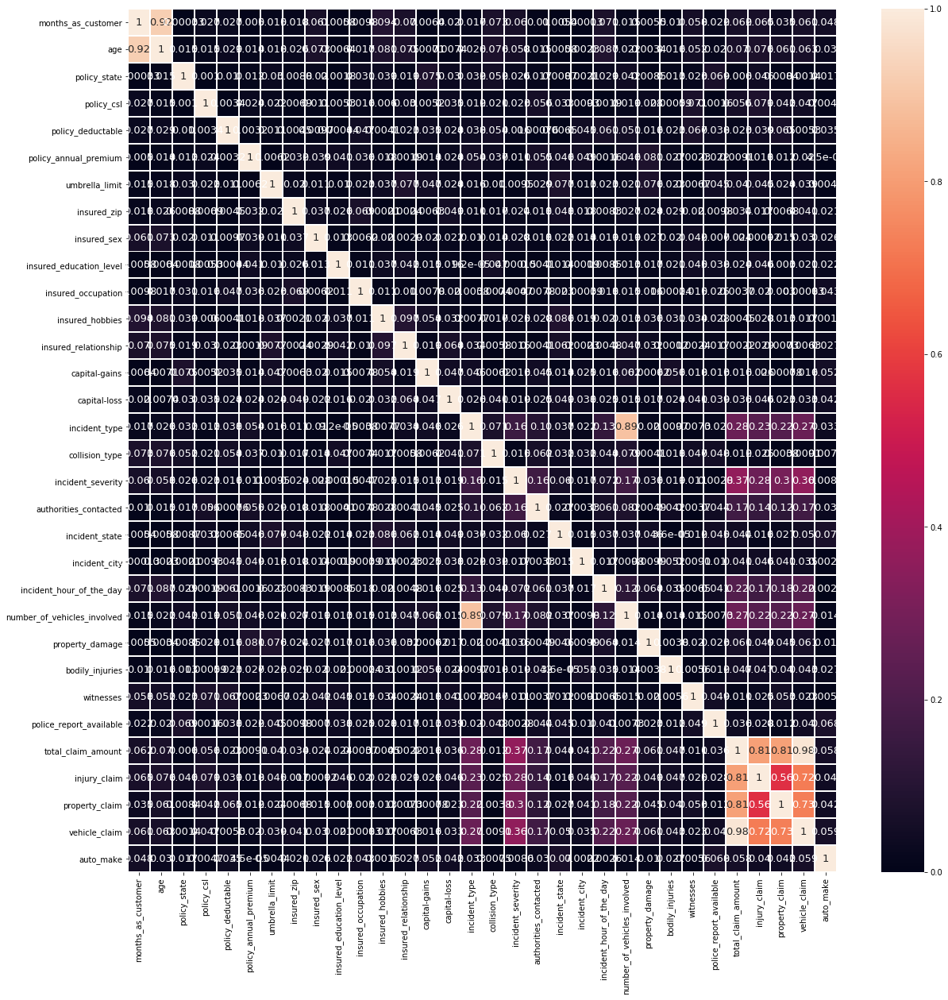

In [200]:
plt.figure(figsize=(20,20))
sns.heatmap(data.iloc[:,:-10].corr().abs(),annot=True,annot_kws={"size":13},linewidths=True)
plt.show()

vehicle_claim is 98 % colinear with total_claim amount

incident type is 89% colinear with number_of_vehicles_involved

month as customer is 92% colinear with age.

In [201]:
data['fraud_reported']=data['fraud_reported'].replace({"Y":1,"N":0})

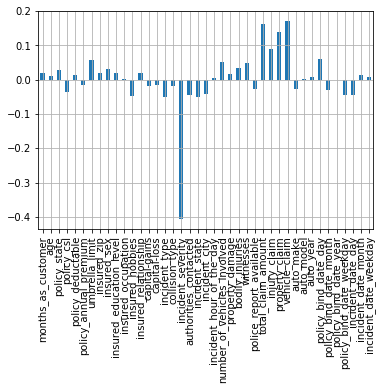

In [202]:
data.drop("fraud_reported",axis=1).corrwith(data.fraud_reported).plot(kind='bar',grid=True)

fraud_reported is highly dependent on incident severity.

## Data Cleaning

In [203]:
data.drop(["total_claim_amount","age","incident_type"],axis=1,inplace=True)

In [204]:
data.drop_duplicates(inplace=True)

In [205]:
data.skew()

months_as_customer             0.362177
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.004532
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.863806
bodily_injuries                0.014777
witnesses                      0.019636
police_report_available        0.802728


In [206]:
## Removing outliers.

features=['policy_annual_premium','umbrella_limit','property_claim',"incident_date_month"]
zscore=zscore(data[features])
abs_Zscore=np.abs(zscore)
filtered=(abs_Zscore<3).all(axis=1)
data=data[filtered]

In [207]:
data.shape

(981, 39)

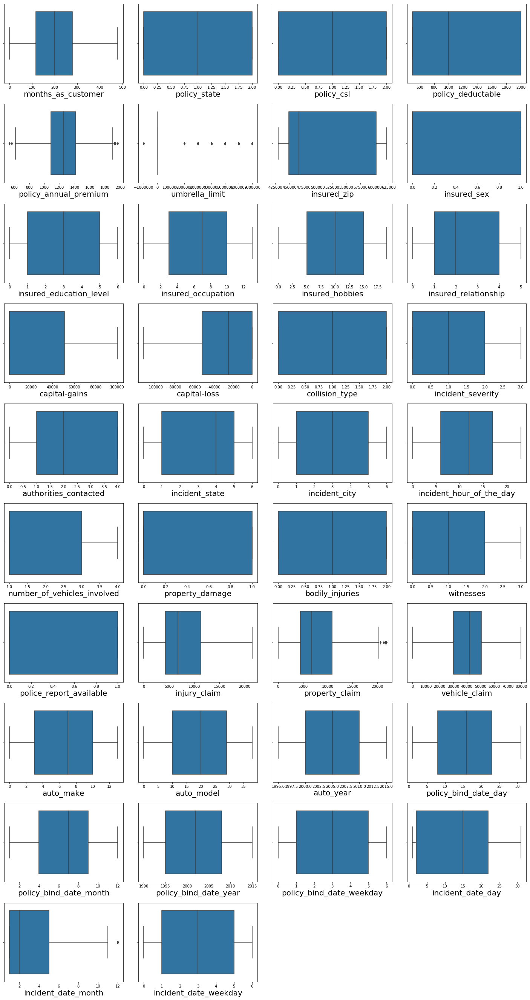

In [208]:
plt.figure(figsize=(20,40))
graph=1
for col in data.drop(columns=['fraud_reported'],axis=1):
    if graph<=44:
        ax=plt.subplot(11,4,graph)
        sns.boxplot(data[col])
        plt.xlabel(col,fontsize=20)
    graph+=1
plt.tight_layout()

There are now less ouliers in comparision to previous box-plot.

In [209]:
## Using PowerTransformer technique to normalize dataset.

features=['property_damage','police_report_available','vehicle_claim','incident_date_month']
scalar=PowerTransformer(method='yeo-johnson')
data[features]=scalar.fit_transform(data[features].values)
data[features].head()

,property_damage,police_report_available,vehicle_claim,incident_date_month
0,1.513918,1.474706,0.757816,-1.101290
1,-0.660538,-0.678101,-1.788203,-1.101290
2,-0.660538,-0.678101,-0.821553,-0.021758
3,-0.660538,-0.678101,0.681441,1.557856
4,-0.660538,-0.678101,-1.741666,-0.021758


In [210]:
data.skew()

months_as_customer             0.363268
policy_state                  -0.038101
policy_csl                     0.098092
policy_deductable              0.473431
policy_annual_premium          0.034884
umbrella_limit                 1.803065
insured_zip                    0.838685
insured_sex                    0.141238
insured_education_level       -0.001492
insured_occupation            -0.057292
insured_hobbies               -0.060134
insured_relationship           0.076242
capital-gains                  0.465985
capital-loss                  -0.390468
collision_type                -0.032704
incident_severity              0.278443
authorities_contacted         -0.112301
incident_state                -0.147048
incident_city                  0.042537
incident_hour_of_the_day      -0.038146
number_of_vehicles_involved    0.506989
property_damage                0.854687
bodily_injuries                0.001877
witnesses                      0.024567
police_report_available        0.797825


Here we reduce skewness. but not used Powertransformed to column like umbrella limit and insured_zip as these two variables are either get highly skewed or the values becomes zero.

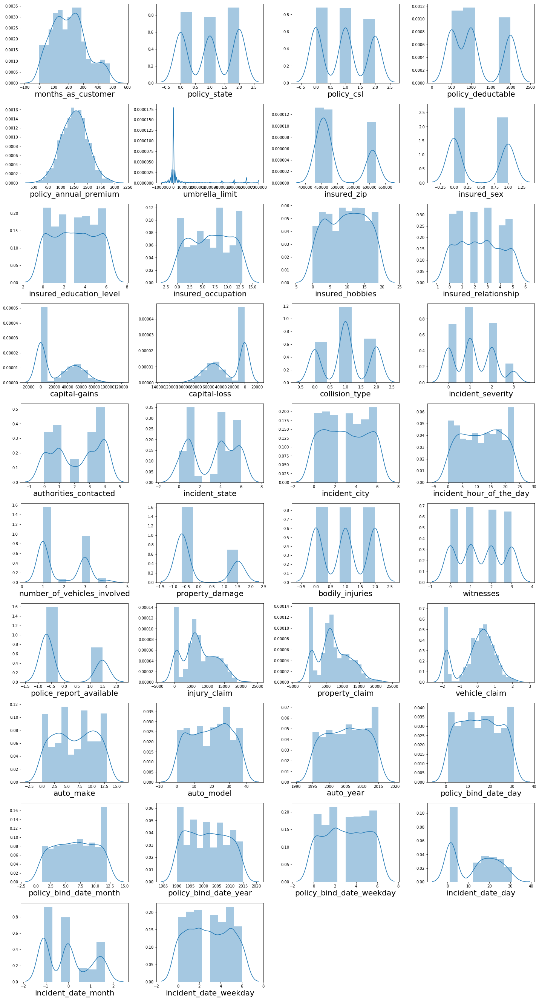

In [211]:
plt.figure(figsize=(20,40))
graph=1
for col in data.drop(columns=['fraud_reported'],axis=1):
    if graph<=44:
        ax=plt.subplot(11,4,graph)
        sns.distplot(data[col])
        plt.xlabel(col,fontsize=20)
    graph+=1
plt.tight_layout()

In [212]:
df=data.copy()

In [213]:
## Using PowerTransformer technique to normalize dataset.

features=['umbrella_limit','insured_zip']
scalar=PowerTransformer(method='yeo-johnson')
df[features]=scalar.fit_transform(df[features].values)
df[features].head()

,umbrella_limit,insured_zip
0,-0.336839,0.0
1,1.483266,0.0
2,1.483266,0.0
3,1.789387,0.0
4,1.789387,0.0


In [214]:
df[features].skew()

umbrella_limit   -7.939425
insured_zip       0.000000
dtype: float64

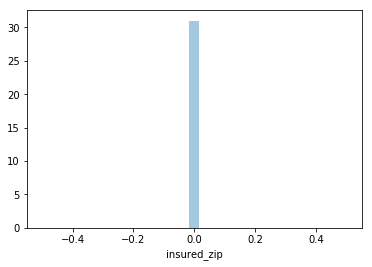

In [215]:
sns.distplot(df['insured_zip'])

In [216]:
df.insured_zip.unique()

array([0.])

Showing why I did not used PowerTransformer techniques to these columns.

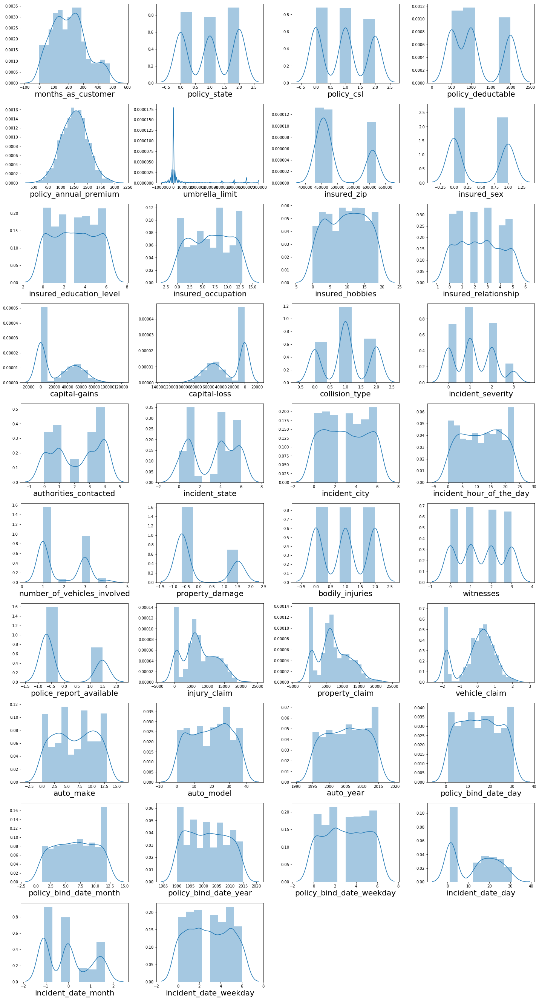

In [217]:
plt.figure(figsize=(20,40))
graph=1
for col in data.drop(columns=['fraud_reported'],axis=1):
    if graph<=44:
        ax=plt.subplot(11,4,graph)
        sns.distplot(data[col])
        plt.xlabel(col,fontsize=20)
    graph+=1
plt.tight_layout()

Now we reduced skewness in all columns.

#### Data Lost

In [218]:
data.shape

(981, 39)

In [221]:
print(f"Data loss: {round(((1000-981)/1000)*100,2)}%")

Data loss: 1.9%


In [222]:
X=data.drop(['fraud_reported'],axis=1)
Y=data.fraud_reported

In [223]:
#### Using standard Scalar to standarized the datset,

scalar=StandardScaler()
X_=scalar.fit_transform(X)
X_

array([[ 1.07026401,  1.18044717,  0.06719701, ...,  1.14366906,
        -1.10128971,  1.55917477],
       [ 0.20299132, -0.02456706,  0.06719701, ...,  0.75960766,
        -1.10128971, -0.47615517],
       [-0.61224501,  1.18044717, -1.17658163, ...,  0.85562301,
        -0.02175833,  1.55917477],
       ...,
       [-0.64693592,  1.18044717,  0.06719701, ...,  0.95163836,
        -1.10128971,  0.5415098 ],
       [ 2.1977185 , -1.22958128,  1.31097565, ...,  1.2396844 ,
        -0.02175833,  0.03267732],
       [ 2.18037305,  1.18044717,  0.06719701, ...,  1.2396844 ,
        -0.02175833,  0.03267732]])

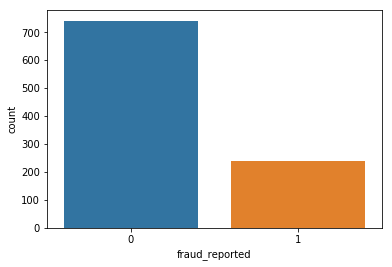

In [224]:
sns.countplot(Y)

Data is imbalanced

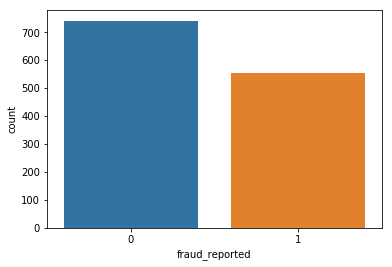

In [225]:
## Balancing Dataset.

over_sampling=SMOTE(0.75)
X_,Y=over_sampling.fit_resample(X_,Y)

sns.countplot(Y)

In [227]:
X_.shape

(1296, 38)

In [228]:
from sklearn.decomposition import PCA
pca=PCA()
pca.fit_transform(X_)

array([[ 0.38965716,  2.61938607,  1.93208097, ...,  0.89641477,
         0.23513101,  0.04138459],
       [-3.19713337,  0.59374474, -0.16109826, ...,  0.06192467,
         0.24731902, -0.06670672],
       [-0.77097054, -0.10406837, -0.36524204, ..., -1.0212184 ,
        -0.64684254, -0.25481815],
       ...,
       [-2.6517336 , -1.01923495,  0.40078754, ...,  0.17788354,
        -0.15023733, -0.28516539],
       [ 1.43294636,  1.87587646,  0.05193124, ...,  0.55864411,
         0.22751768, -0.21423324],
       [ 0.18242045,  0.74348808, -0.88313533, ..., -0.08449976,
         0.26876341, -0.06318518]])

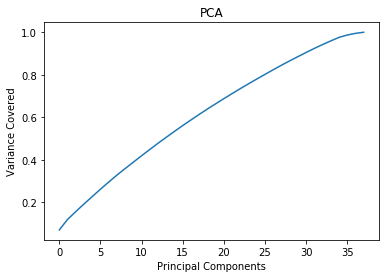

In [230]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("Principal Components")
plt.ylabel("Variance Covered")
plt.title("PCA")
plt.show()

From above graph I analyse that selecting 32 Components will be beter to cover variane while others covers less variance.

In [232]:
npca=PCA(n_components=32)
np_com=npca.fit_transform(X_)
pcomp=pd.DataFrame(np_com,columns="P1 P2 P3 P4 P5 P6 P7 P8 P9 P10 P11 P12 P13 P14 P15 P16 P17 P18 P19 P20 P21 P22 P23 P24 P25 P26 P27 P28 P29 P30 P31 P32".split(" "))
pcomp

,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,...,P23,P24,P25,P26,P27,P28,P29,P30,P31,P32
0,0.389657,2.619386,1.932081,-2.314794,0.236193,-0.683448,-0.764513,-0.730729,-0.307838,-0.305839,...,0.448464,-0.449214,1.755180,-0.724422,1.425237,-0.663500,0.263092,0.527720,1.114119,-0.703859
1,-3.197133,0.593745,-0.161098,0.371266,0.117338,0.034612,1.881560,-0.065315,0.299149,-0.182663,...,-0.503551,-1.544180,0.956676,-0.414681,0.078462,-0.235167,0.404317,1.249607,-0.700395,0.320564
2,-0.770971,-0.104068,-0.365242,1.789883,-1.349166,-0.169526,-1.295501,0.309969,0.422220,-0.904236,...,0.214554,-0.877255,-1.662304,-0.474428,0.958892,-0.443336,1.053014,-0.563422,-0.971311,0.846822
3,0.073010,-2.741394,-0.181692,3.124067,-0.028322,-0.541320,0.443293,1.051328,0.179611,-2.105420,...,-0.587784,0.317252,0.699866,0.221150,0.241784,-1.427804,-1.194534,-1.037808,0.126600,0.141580
4,-2.226998,-0.543274,-1.163594,2.942014,0.385103,0.342655,-1.684650,0.613873,0.057018,0.236688,...,-1.421164,0.345112,1.695387,-0.849894,-1.006542,0.172756,-1.926050,0.122413,-0.370283,-1.051038
5,1.115240,-0.300916,0.375768,-1.371675,1.045588,0.145289,-0.592018,-0.447047,1.036910,1.180989,...,-0.437311,0.444988,-0.428547,0.122794,0.837625,-0.651950,-0.121495,0.942080,-0.638191,0.107723
6,1.229941,0.406197,-0.552298,1.588836,-0.299180,0.929649,1.763969,0.000107,-0.749560,-0.997316,...,-0.405777,0.075252,-0.303626,2.578330,-1.841669,-1.182189,-0.598540,1.583740,-1.054416,-0.134445
7,0.042867,0.155727,0.067632,1.261791,1.079907,-0.527749,-0.822221,0.889760,-0.062179,-1.443509,...,-0.308063,1.598237,-1.577146,-1.390656,-0.380231,1.363493,-1.387788,-1.189082,-0.318059,0.859181
8,-2.442740,1.692996,-0.342560,-0.996294,0.660187,-0.129053,-0.104876,0.482346,-0.188492,-1.810002,...,-0.264236,0.592664,0.317360,-0.913627,-0.217791,0.817042,-2.009995,0.284619,-0.204268,1.088707
9,-1.194997,-2.120648,-0.231463,-0.581372,1.746325,-0.365354,0.031567,0.741093,-1.115859,0.115201,...,-0.954118,0.404834,-1.938858,-0.119948,0.268506,-0.392923,-0.440965,0.641932,1.106880,-0.359859


In [251]:
Linear=LogisticRegression()
DecisionTree=DecisionTreeClassifier()
RandomForest=RandomForestClassifier()
AdaBoost=AdaBoostClassifier()
Bagging=BaggingClassifier()
knn=KNeighborsClassifier()
svmm=SVC()
algo=[Linear,DecisionTree,RandomForest,AdaBoost,Bagging,svmm,knn]


In [252]:
model_acc_rs={}
maximum_acc=[]
for model in algo:
    max_accuracy=0
    for i in range(10,151,10):
        X_train,X_test,Y_train,Y_test=train_test_split(X_,Y,test_size=0.2,random_state=i)
        model.fit(X_train,Y_train)
        Y_pred=model.predict(X_test)
        accuracy=accuracy_score(Y_test,Y_pred)*100
        if accuracy>max_accuracy:
            max_accuracy=accuracy
            rs=i
    maximum_acc.append(max_accuracy)
    model_acc_rs[model]=[max_accuracy,rs]
    print(f"{model}:\n---------------------------\n---------------------------\n")
    print(f"The highest accuracy is {max_accuracy} of model {model} at random state {rs}")


    print("\n\nConfusion Matrix:\n\n",confusion_matrix(Y_test,Y_pred))

    print(f"\n\n\n Classification report for the model:\n",classification_report(Y_test,Y_pred))
    

LogisticRegression():
---------------------------
---------------------------

The highest accuracy is 77.3076923076923 of model LogisticRegression() at random state 30


Confusion Matrix:

 [[118  31]
 [ 38  73]]



 Classification report for the model:
               precision    recall  f1-score   support

           0       0.76      0.79      0.77       149
           1       0.70      0.66      0.68       111

    accuracy                           0.73       260
   macro avg       0.73      0.72      0.73       260
weighted avg       0.73      0.73      0.73       260

DecisionTreeClassifier():
---------------------------
---------------------------

The highest accuracy is 86.53846153846155 of model DecisionTreeClassifier() at random state 20


Confusion Matrix:

 [[122  27]
 [ 21  90]]



 Classification report for the model:
               precision    recall  f1-score   support

           0       0.85      0.82      0.84       149
           1       0.77      0.81      0.79

Here we can see the highest model accuracy of each moel with their best Random state,Confusion Matrix,Classification Report.

In [253]:
CVmodel={}

for model in algo:
    CVscore_={}
    print(f"\n{model}")
    print("-"*25)
    print("\n")
    for i in range(11,20):
        cvS=cross_val_score(model,X_,Y,cv=i)
        CVscore_[i]=cvS.mean()
        print(f"Mean CV Score of model {model}:: {cvS.mean()} at k-fold::{i}\n")
    CVdata=pd.DataFrame(CVscore_,index=[""])
    CVmodel[str(model)]=CVdata.max(axis=1).tolist()


LogisticRegression()
-------------------------


Mean CV Score of model LogisticRegression():: 0.7469216282775605 at k-fold::11

Mean CV Score of model LogisticRegression():: 0.7461419753086419 at k-fold::12

Mean CV Score of model LogisticRegression():: 0.7507847707847707 at k-fold::13

Mean CV Score of model LogisticRegression():: 0.7500417418019101 at k-fold::14

Mean CV Score of model LogisticRegression():: 0.7446761115566248 at k-fold::15

Mean CV Score of model LogisticRegression():: 0.7484567901234567 at k-fold::16

Mean CV Score of model LogisticRegression():: 0.7454666076957099 at k-fold::17

Mean CV Score of model LogisticRegression():: 0.7422839506172839 at k-fold::18

Mean CV Score of model LogisticRegression():: 0.7446717817561808 at k-fold::19


DecisionTreeClassifier()
-------------------------


Mean CV Score of model DecisionTreeClassifier():: 0.8187678611407425 at k-fold::11

Mean CV Score of model DecisionTreeClassifier():: 0.8194444444444443 at k-fold::12

Mean CV 

In [254]:
CVmodel

{'LogisticRegression()': [0.7507847707847707],
 'DecisionTreeClassifier()': [0.8310185185185185],
 'RandomForestClassifier()': [0.8637097859738863],
 'AdaBoostClassifier()': [0.8536519036519036],
 'BaggingClassifier()': [0.8665123456790124],
 'SVC()': [0.8574592074592076],
 'KNeighborsClassifier()': [0.6861266947171576]}

here we can see the maximun CV score of each model

In [255]:
m=list(CVmodel.keys())

print("The least difference between the accuracy and CV score of each model is::\n")
for i in range(7):
    print(f"{m[i]}::{round(np.abs(CVmodel[m[i]][0]*100-maximum_acc[i]),2)}")

The least difference between the accuracy and CV score of each model is::

LogisticRegression()::2.23
DecisionTreeClassifier()::3.44
RandomForestClassifier()::3.24
AdaBoostClassifier()::0.4
BaggingClassifier()::2.58
SVC()::2.72
KNeighborsClassifier()::1.0


here for model AdaBoostClassifier() we get the least value i.e. the difference between the accuracy and cvScore of this model is 0.4

In [242]:
X_train,X_test,Y_train,Y_test=train_test_split(X_,Y,test_size=0.2,random_state=30)

here we split the dataset in training and testing dataset at RandomState 30

#### Plotting ROC Curve

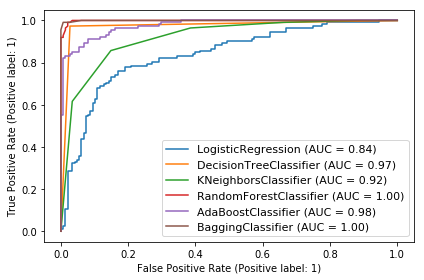

In [243]:
dis=plot_roc_curve(Linear,X_test,Y_test)
plot_roc_curve(DecisionTree,X_test,Y_test,ax=dis.ax_)
plot_roc_curve(knn,X_test,Y_test,ax=dis.ax_)
plot_roc_curve(RandomForest,X_test,Y_test,ax=dis.ax_)
plot_roc_curve(AdaBoost,X_test,Y_test,ax=dis.ax_)
plot_roc_curve(Bagging,X_test,Y_test,ax=dis.ax_)
plt.legend(prop={'size':11},loc='lower right')
plt.tight_layout()

## Hyperparameter Tuning

In [248]:

clf=AdaBoostClassifier()
param={
    "base_estimator":[RandomForest,Bagging],
    "n_estimators":[48,49],
    "learning_rate":[0.01,0.005],
    "algorithm" : ['SAMME', 'SAMME.R'],
}
grd=GridSearchCV(clf,param_grid=param)
grd.fit(X_train,Y_train)
print("Best Pramaeters:",grd.best_params_)

clf=grd.best_estimator_   #reinstantiating the beast parameter to algo

clf.fit(X_train,Y_train)
ypred=clf.predict(X_test)

print("Confusion Matrix::\n",confusion_matrix(Y_test,ypred))

print("Accuracy::",round(accuracy_score(Y_test,ypred)*100,2))

print("Classification Report::\n",classification_report(Y_test,ypred))

print("\n\nPredicted values:\n",Y_pred)

print("\n\nThe dataframe for the actual & predicted values:\n\n",pd.DataFrame({"Actual data":Y_test,"Predicted":Y_pred}))

Best Pramaeters: {'algorithm': 'SAMME.R', 'base_estimator': BaggingClassifier(), 'learning_rate': 0.01, 'n_estimators': 48}
Confusion Matrix::
 [[136  12]
 [ 13  99]]
Accuracy:: 90.38
Classification Report::
               precision    recall  f1-score   support

           0       0.91      0.92      0.92       148
           1       0.89      0.88      0.89       112

    accuracy                           0.90       260
   macro avg       0.90      0.90      0.90       260
weighted avg       0.90      0.90      0.90       260



Predicted values:
 [1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 0 1 1 0 1 1 1 1 1 0 1 1
 1 0 0 0 0 1 1 1 1 0 1 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 0 0 1
 0 1 1 1 0 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 1
 1 1 1 1 0 0 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 0 0 0 1 1 0 1 1 0 1 1 1 1 1 1
 1 1 1 0 1 1 1 1 1 0 0 0 1 0 1 0 1 1 1 0 1 1 1 1 0 0 1 1 0 1 1 1 1 0 1 1 1
 1 1 1 1 1 1 1 0 1 1 0 1 0 1 0 0 1 1 0 1 1 1 1 1 1 1 1 1 0 1 1 0 1 0

accuracy increased earlier it was 85% now it's 90.38%

### Saving Model

In [249]:
import pickle
pickle.dump(clf,open("insuranceClaim_fraudPrediction.pickle","wb"))